In [10]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import missingno as msno
import seaborn as sns
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
import category_encoders as ce

In [2]:
train = pd.read_csv("C:/Users/10188/local_git/tabular-playground-series-apr-2021/train.csv")
test = pd.read_csv("C:/Users/10188/local_git/tabular-playground-series-apr-2021/test.csv")

In [4]:

def fillNA(df,cols, replaceString='X'):
    df[cols] = df[cols].fillna(replaceString).astype('string')
    return df

# fillna
train = fillNA(train, ['Ticket','Cabin','Embarked'])
test = fillNA(test, ['Ticket','Cabin','Embarked'])


In [6]:

# add family size variable
train['famsize'] = train.apply(lambda x: x['SibSp']+x['Parch'], axis=1)
test['famsize'] = test.apply(lambda x: x['SibSp']+x['Parch'], axis=1)

# Ticket type
train['Ticket_alpha'] = train['Ticket'].apply(lambda x: x.split(' ')[0])
train['Ticket_alpha'] = train['Ticket_alpha'].apply(lambda x: x if x.upper().isupper() else "X")
train['Ticket_num'] = train['Ticket'].apply(lambda x: x.split(' ')[1][:2] if x != 'X' and x.upper().isupper() else x[:2])

test['Ticket_alpha'] = test['Ticket'].apply(lambda x: x.split(' ')[0])
test['Ticket_alpha'] = test['Ticket_alpha'].apply(lambda x: x if x.upper().isupper() else "X")
test['Ticket_num'] = test['Ticket'].apply(lambda x: x.split(' ')[1][:2] if x != 'X' and x.upper().isupper() else x[:2])


C:\Users\10188\Anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


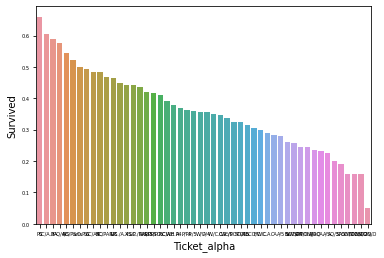

C:\Users\10188\Anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


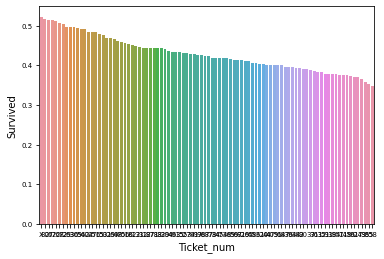

In [7]:

# compare survival ratio by Ticket - BY TRAIN DATA  
alpha_ratio = train.groupby('Ticket_alpha').mean()[['Survived']].sort_values(by='Survived', ascending=False)
plot = sns.barplot(alpha_ratio.index, alpha_ratio.Survived)
plot.tick_params(labelsize=5)
plt.show() # --> add Ticket_alpha variable (survival ratio between 0.1~0.6 : difference)


num_ratio = train.groupby('Ticket_num').mean()[['Survived']].sort_values(by='Survived', ascending=False)
plot = sns.barplot(num_ratio.index, num_ratio.Survived)
plot.tick_params(labelsize=7)
plt.show() # --> drop Ticket_num varible (survival ratio between 0.3~0.5 : similar)


C:\Users\10188\Anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


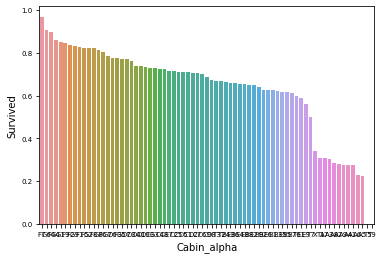

In [8]:

# Cabin type -> A,B,C,D,E,F,G,S
# train['HaveCabin'] = train['Cabin'].apply(lambda x :0 if x == "X" else 1)
train['Cabin_alpha'] = train['Cabin'].apply(lambda x: x[:2])
test['Cabin_alpha'] = test['Cabin'].apply(lambda x: x[:2])

# compare survival ratio by cabin 
cabin_ratio = train.groupby(['Cabin_alpha']).mean()[['Survived']].sort_values(by='Survived', ascending=False)
plot = sns.barplot(cabin_ratio.index, cabin_ratio.Survived)
plot.tick_params(labelsize=7)
plt.show() 


C:\Users\10188\Anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


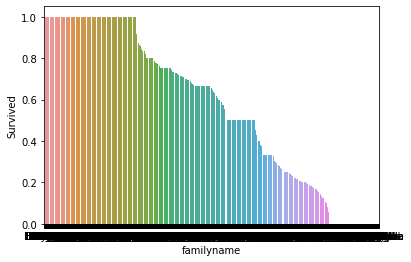

C:\Users\10188\Anaconda3\lib\site-packages\category_encoders\utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


In [11]:

# # get Family name
train['familyname'] = train['Name'].apply(lambda x:x.split(' ')[1])
familyname_ratio = train.groupby('familyname').mean()[['Survived']].sort_values(by='Survived', ascending=False)
sns.barplot(familyname_ratio.index, familyname_ratio.Survived)
plt.show() # --> have huge difference


test['familyname'] = test['Name'].apply(lambda x: x.split(' ')[1])

# drop Name, familyname and add survival ratio by familyname -->  Target encoding instead of familyname
target_encoder = ce.TargetEncoder()
train['survival_ratio'] = target_encoder.fit_transform(train.familyname, train.Survived).values

ratio_dict = pd.Series(familyname_ratio.Survived.values, index=familyname_ratio.index).to_dict()
test['survival_ratio'] = test['familyname'].map(ratio_dict)
test['survival_ratio'] = test['survival_ratio'].fillna(np.median(familyname_ratio))


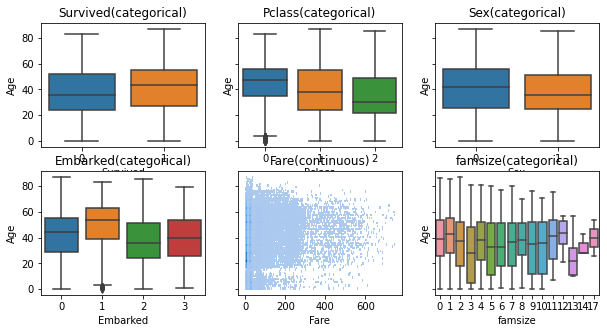

In [12]:
# label encoding
def labeling(df, columns):
    encoder = LabelEncoder()
    for c in columns:
        col = encoder.fit_transform(df[c])
        df[c] = col
    return df
    
# labeling categorical variable
train = labeling(train, ['Pclass', 'Sex','Embarked','Ticket_alpha','Cabin_alpha'])
test = labeling(test, ['Pclass', 'Sex','Embarked','Ticket_alpha','Cabin_alpha'])

## categorical variable correlation with target variable
# survived / pclass / sex / embarked vs age : boxplot , sibsp / parch / fare vs age : scatter plot
fig, axes = plt.subplots(2,3,figsize=(10,5), sharey=True)

sns.boxplot(x='Survived', y='Age',data=train, ax=axes[0,0])
axes[0,0].set_title("Survived(categorical)")
sns.boxplot(x='Pclass', y='Age',data=train, ax=axes[0,1])
axes[0,1].set_title("Pclass(categorical)")
sns.boxplot(x='Sex', y='Age',data=train, ax=axes[0,2])
axes[0,2].set_title("Sex(categorical)")
sns.boxplot(x='Embarked', y='Age',data=train, ax=axes[1,0])
axes[1,0].set_title("Embarked(categorical)")
sns.histplot(x='Fare', y='Age', data=train, ax=axes[1,1])
axes[1,1].set_title("Fare(continuous)")
sns.boxplot(x='famsize', y='Age', data=train, ax=axes[1,2])
axes[1,2].set_title("famsize(categorical)")
plt.show() #----------------> Age and Pclass


In [ ]:

# check correlation with each other
sns.pairplot(train)
plt.show()
sns.heatmap(train.corr(), annot=True)
plt.show() # Fare: Pclass와 0.4 correlation (Pclass별로 Fare를 impute)


No handles with labels found to put in legend.
No handles with labels found to put in legend.


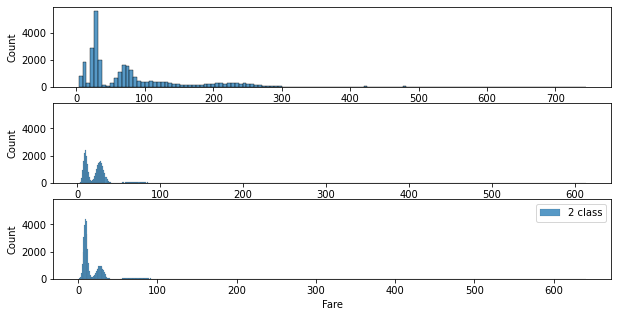

In [19]:
# 1. IMPUTE FARE
fig, axes = plt.subplots(3,1,figsize=(10,5), sharey=True)
for i in range(3):
    sns.histplot(train[train['Pclass']==i]['Fare'], label='{} class'.format(i), legend=True,ax=axes[i])
    plt.legend()
plt.show() # right_skewed --> use median instead of mean

# impute Fare with groupby median(Pclass)

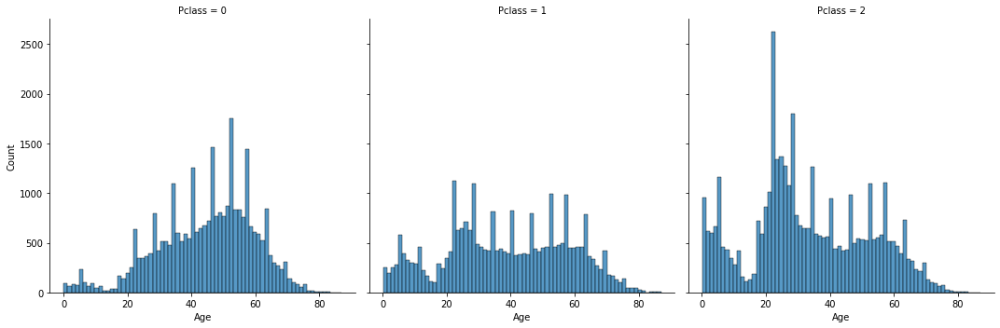

In [18]:

# 2. IMPUTE AGE
sns.displot(data=train, x='Age',col='Pclass', multiple='dodge')
plt.show()
